In [ ]:
#scvi doesn't work without next 3
%pip install pymde
%pip install leidenalg
%pip install igraph
%pip install --quiet gdown
%pip install seaborn
%pip install --quiet bbknn
%pip install pandas
%pip install ipywidgets
%pip install MulticoreTSNE
%pip install scipy
%pip install scikit-misc
#if you're going to install pytorch or JAX for accelerated computing do it before scvi
%pip install scanpy
%pip install anndata
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu124
%pip install nvidia-cuda-runtime-cu12
%pip install nvidia-<library>
%pip install -U scvi-tools

^C
Note: you may need to restart the kernel to use updated packages.




Import packages

In [2]:
import pathlib
import numpy as np
import scanpy as sc
import scanpy.external as sce
import pandas as pd

#pyscenic
import anndata as ad
from anndata.experimental.multi_files import AnnCollection
#specific requirements of pyscenic
import loompy as lp

## This is T-SNE, download has wheel error, could fix... could use UM
#from MulticoreTSNE import MulticoreTSNE as TSNE

#data vis
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import umap
#scvi
import leidenalg
import igraph
import pymde
import torch
import tempfile
import scvi




d:\Coding\comp_bio\endometrial_analysis\scripts\scvi\.venv\Lib\site-packages\anndata\utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
d:\Coding\comp_bio\endometrial_analysis\scripts\scvi\.venv\Lib\site-packages\anndata\utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
d:\Coding\comp_bio\endometrial_analysis\scripts\scvi\.venv\Lib\site-packages\anndata\utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
d:\Coding\comp_bio\endometrial_analysis\scripts\scvi\.venv\Lib\site-packages\anndata\utils.py:429: FutureWarning: Importing CSCDataset from `anndata.experimental` is deprecated. Import anndata.abc.CSCDataset instead.
  warnings.warn(msg, FutureWarning)
d:\Coding\comp_bio\endometrial_analysi

In [3]:
current_directory = pathlib.Path.cwd()
module_directory = current_directory.parent.parent

input_path = module_directory / "input"
scrna_metadata_path = input_path /"scRNA_metadata"

dataset_type = "heca_vsdisease"
output_path = module_directory / 'output'
scrna_whole_path = output_path / 'integrated_scRNA'
scrna_output = scrna_whole_path /dataset_type
other_output = output_path / 'scvi' / dataset_type
scrna_output/dataset_type

for path in [scrna_output, other_output]:
    if not path.exists():
        print(f"Directory {path} does not exist. Creating it now...")
        path.mkdir(parents=True, exist_ok=True)
    else:
        print(f"Directory {path} already exists.")

Directory d:\Coding\comp_bio\endometrial_analysis\output\integrated_scRNA\heca_vsdisease already exists.
Directory d:\Coding\comp_bio\endometrial_analysis\output\scvi\heca_vsdisease already exists.


In [4]:
import shutil

total, used, free = shutil.disk_usage("/")
print(f"Total: {total // (2**30)} GiB")
print(f"Used: {used // (2**30)} GiB")
print(f"Free: {free // (2**30)} GiB")

Total: 931 GiB
Used: 383 GiB
Free: 547 GiB


In [5]:

sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
#save_dir = tempfile.TemporaryDirectory()
#%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
#%config InlineBackend.figure_format="retina"
!nvidia-smi

Tue Dec 10 15:17:32 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 566.14                 Driver Version: 566.14         CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1070      WDDM  |   00000000:02:00.0 Off |                  N/A |
|  0%   30C    P8              9W /  185W |    1336MiB /   8192MiB |      8%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [6]:


print(f"Is CUDA supported by this system? {torch.cuda.is_available()}")
print(f"CUDA version: {torch.version.cuda}")

# Storing ID of current CUDA device
cuda_id = torch.cuda.current_device()
print(f"ID of current CUDA device:{torch.cuda.current_device()}")
	
print(f"Name of current CUDA device:{torch.cuda.get_device_name(cuda_id)}")

#Garrett if this is false for you -- 
## run this in powershell (assuming windows/pip/python): pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu124
## OR just comment out the next block rewrite it without the accelerator. It will take longer

Is CUDA supported by this system? True
CUDA version: 12.4
ID of current CUDA device:0
Name of current CUDA device:NVIDIA GeForce GTX 1070


In [7]:
scvi.settings.seed = 0
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

Seed set to 0


Data Exploration

In [16]:
combined_adata = sc.read(scrna_whole_path/"heca_data_combined_on_disk.h5ad")
combined_adata.obs_names_make_unique()

d:\Coding\comp_bio\endometrial_analysis\scripts\scvi\.venv\Lib\site-packages\anndata\_core\anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [17]:
combined_adata.obs.head()


,dataset
AAACCCAAGGCTTTCA-1,FRZFRESH_GX25_ES345
AAACCCACAAGCTCTA-1,FRZFRESH_GX25_ES345
AAACCCAGTACGGTTT-1,FRZFRESH_GX25_ES345
AAACCCAGTAGGACCA-1,FRZFRESH_GX25_ES345
AAACCCATCCCGAGGT-1,FRZFRESH_GX25_ES345


In [ ]:
#read text file into pandas DataFrame
df = pd.read_csv(scrna_metadata_path/'E-MTAB-14039.sdrf.txt', sep='\t', comment='#', on_bad_lines='skip')
#print(df.columns)
#healthy_tissue = df[df['Characteristics[disease]'] == 'normal']['Source Name']
#print(len(healthy_tissue))

meta_df_filtered = df[['Source Name', 
                            'Characteristics[disease]', 
                            'Factor Value[library_id]',
                            'Factor Value[menstrual_cycle_stage]', 
                            'Factor Value[menstrual_cycle_stage_fine]']]

KeyError: 'num_cells'

In [20]:
meta_df_filtered[:4]
batch_counts = combined_adata.obs['dataset'].value_counts()
batch_table = pd.DataFrame({
    'dataset_id': batch_counts.index,
    'num_cells': batch_counts.values
})
meta_df_filtered.loc[:, 'num_cells'] = meta_df_filtered['Source Name'].map(batch_counts)

C:\Users\Olaf\AppData\Local\Temp\ipykernel_10052\2484842344.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_df_filtered.loc[:, 'num_cells'] = meta_df_filtered['Source Name'].map(batch_counts)


In [25]:
meta_df_filtered

,Source Name,Characteristics[disease],Factor Value[library_id],Factor Value[menstrual_cycle_stage],Factor Value[menstrual_cycle_stage_fine],num_cells
0,FRZFRESH_GX25_ES345,normal,FRZFRESH_GX25,Secretory,Secretory Early,2849
1,FRZFRESH_GX26_ES345,normal,FRZFRESH_GX26,Secretory,Secretory Early,2371
2,FRZFRESH_GX27_ES345,normal,FRZFRESH_GX27,Secretory,Secretory Early,3507
3,FRZFRESH_GX28_ES345,normal,FRZFRESH_GX28,Secretory,Secretory Early,1855
4,HCA_A_RepT_RNA13247830_A70,normal,HCA_A_RepT_RNA13247830,Proliferative,Proliferative,7067
...,...,...,...,...,...,...
98,UA_Endo9426400_FX1146,normal,UA_Endo9426400,Proliferative,Proliferative,2658
99,UA_Endo9426401_FX1156,endometriosis,UA_Endo9426401,Secretory,Secretory Mid,7214
100,UA_Endo9426401_FX9006,endometriosis,UA_Endo9426401,Secretory,Secretory Early,9439
101,UA_Endo9426402_FX1156,endometriosis,UA_Endo9426402,Secretory,Secretory Mid,794


In [11]:
print(df['Characteristics[disease]'].unique())

['normal' 'endometriosis']


In [14]:
batch_counts = combined_adata.obs['dataset'].value_counts()
batch_table = pd.DataFrame({
    'dataset_id': batch_counts.index,
    'num_cells': batch_counts.values
})
meta_df_filtered.loc[:, 'num_cells'] = meta_df_filtered['Source Name'].map(batch_counts)

C:\Users\Olaf\AppData\Local\Temp\ipykernel_10052\2550449688.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_df_filtered.loc[:, 'num_cells'] = meta_df_filtered['Source Name'].map(batch_counts)


In [15]:
meta_df_filtered

,Source Name,Characteristics[disease],Factor Value[library_id],Factor Value[menstrual_cycle_stage],Factor Value[menstrual_cycle_stage_fine],num_cells
0,FRZFRESH_GX25_ES345,normal,FRZFRESH_GX25,Secretory,Secretory Early,NaN
1,FRZFRESH_GX26_ES345,normal,FRZFRESH_GX26,Secretory,Secretory Early,NaN
2,FRZFRESH_GX27_ES345,normal,FRZFRESH_GX27,Secretory,Secretory Early,NaN
3,FRZFRESH_GX28_ES345,normal,FRZFRESH_GX28,Secretory,Secretory Early,NaN
4,HCA_A_RepT_RNA13247830_A70,normal,HCA_A_RepT_RNA13247830,Proliferative,Proliferative,NaN
...,...,...,...,...,...,...
98,UA_Endo9426400_FX1146,normal,UA_Endo9426400,Proliferative,Proliferative,NaN
99,UA_Endo9426401_FX1156,endometriosis,UA_Endo9426401,Secretory,Secretory Mid,NaN
100,UA_Endo9426401_FX9006,endometriosis,UA_Endo9426401,Secretory,Secretory Early,NaN
101,UA_Endo9426402_FX1156,endometriosis,UA_Endo9426402,Secretory,Secretory Mid,NaN


In [13]:
disease_counts = meta_df_filtered.groupby('Characteristics[disease]')['num_cells'].sum()


print(disease_counts )
normal_cells = disease_counts['normal']
endometriosis_cells = disease_counts['endometriosis']


Characteristics[disease]
endometriosis    331701
normal           135489
Name: num_cells, dtype: int64


In [14]:
total_cells = 135489 #135489 
cells_per_group = total_cells / 2

normal_df = meta_df_filtered[meta_df_filtered['Characteristics[disease]'] == 'normal']
endometriosis_df = meta_df_filtered[meta_df_filtered['Characteristics[disease]'] == 'endometriosis']

normal_stage_distribution = normal_df.groupby('Factor Value[menstrual_cycle_stage]')['num_cells'].sum() / normal_df['num_cells'].sum()
endometriosis_stage_distribution = endometriosis_df.groupby('Factor Value[menstrual_cycle_stage]')['num_cells'].sum() / endometriosis_df['num_cells'].sum()

normal_cells_for_true = cells_per_group
endometriosis_cells_for_true = cells_per_group

normal_df['keep'] = False  # Initialize 'keep' column to False
endometriosis_df['keep'] = False  # Initialize 'keep' column to False

# Assign 'True' values to the normal group
for stage, proportion in normal_stage_distribution.items():
    # Calculate the target number of cells for each menstrual cycle stage in the normal group
    stage_cells = round(proportion * normal_cells_for_true)
    stage_df = normal_df[normal_df['Factor Value[menstrual_cycle_stage]'] == stage].sort_values(by='num_cells', ascending=False)
    
    # Assign 'True' to the rows with the highest num_cells for the given stage
    stage_df['keep'] = stage_df['num_cells'].cumsum() <= stage_cells
    normal_df.loc[stage_df.index, 'keep'] = stage_df['keep']

# Assign 'True' values to the endometriosis group
for stage, proportion in endometriosis_stage_distribution.items():
    # Calculate the target number of cells for each menstrual cycle stage in the endometriosis group
    stage_cells = round(proportion * endometriosis_cells_for_true)
    stage_df = endometriosis_df[endometriosis_df['Factor Value[menstrual_cycle_stage]'] == stage].sort_values(by='num_cells', ascending=False)
    
    # Assign 'True' to the rows with the highest num_cells for the given stage
    stage_df['keep'] = stage_df['num_cells'].cumsum() <= stage_cells
    endometriosis_df.loc[stage_df.index, 'keep'] = stage_df['keep']

# Step 4: Concatenate the modified DataFrames back together
meta_df_filtered = pd.concat([normal_df, endometriosis_df])

# Step 5: Ensure the final result is sorted as per the original DataFrame
meta_df_filtered = meta_df_filtered.sort_index()

# Step 6: Check the sum of 'num_cells' for the True values
final_true_sum = meta_df_filtered[meta_df_filtered['keep'] == True]['num_cells'].sum()
print(f"Final sum of 'num_cells' for True values: {final_true_sum}")

# Step 7: Display the resulting DataFrame
print(meta_df_filtered.head())


Final sum of 'num_cells' for True values: 105718
                  Source Name Characteristics[disease]  \
0         FRZFRESH_GX25_ES345                   normal   
1         FRZFRESH_GX26_ES345                   normal   
2         FRZFRESH_GX27_ES345                   normal   
3         FRZFRESH_GX28_ES345                   normal   
4  HCA_A_RepT_RNA13247830_A70                   normal   

  Factor Value[library_id] Factor Value[menstrual_cycle_stage]  \
0            FRZFRESH_GX25                           Secretory   
1            FRZFRESH_GX26                           Secretory   
2            FRZFRESH_GX27                           Secretory   
3            FRZFRESH_GX28                           Secretory   
4   HCA_A_RepT_RNA13247830                       Proliferative   

  Factor Value[menstrual_cycle_stage_fine]  num_cells   keep  
0                          Secretory Early       2849  False  
1                          Secretory Early       2371  False  
2               

C:\Users\Olaf\AppData\Local\Temp\ipykernel_21052\3961354076.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  normal_df['keep'] = False  # Initialize 'keep' column to False
C:\Users\Olaf\AppData\Local\Temp\ipykernel_21052\3961354076.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  endometriosis_df['keep'] = False  # Initialize 'keep' column to False


In [15]:
meta_diseased_secretory = meta_df_filtered[
    (meta_df_filtered['Characteristics[disease]'] == 'endometriosis') & 
    (meta_df_filtered['Factor Value[menstrual_cycle_stage]'] == 'Secretory') & 
    (meta_df_filtered['keep'] == False)
]
meta_diseased_secretory


,Source Name,Characteristics[disease],Factor Value[library_id],Factor Value[menstrual_cycle_stage],Factor Value[menstrual_cycle_stage_fine],num_cells,keep
11,UA_Endo10298212_FX1156,endometriosis,UA_Endo10298212,Secretory,Secretory Early,3229,False
12,UA_Endo10298212_FX9006,endometriosis,UA_Endo10298212,Secretory,Secretory Mid,5149,False
13,UA_Endo10298213_FX1156,endometriosis,UA_Endo10298213,Secretory,Secretory Mid,3559,False
14,UA_Endo10298213_FX9006,endometriosis,UA_Endo10298213,Secretory,Secretory Early,2355,False
16,UA_Endo11173480_FX1205,endometriosis,UA_Endo11173480,Secretory,Secretory,1102,False
17,UA_Endo11173481_FX9022,endometriosis,UA_Endo11173481,Secretory,Secretory Mid,5186,False
21,UA_Endo11460960_EX0366,endometriosis,UA_Endo11460960,Secretory,Secretory Mid,9463,False
22,UA_Endo11460960_FX1100,endometriosis,UA_Endo11460960,Secretory,Secretory Mid,4920,False
25,UA_Endo11460962_FX1141,endometriosis,UA_Endo11460962,Secretory,Secretory,1239,False
27,UA_Endo11460963_FX1215,endometriosis,UA_Endo11460963,Secretory,Secretory Early,3000,False


In [ ]:
source_name_list = ['UA_Endo10298212_FX9006', 'UA_Endo12269814_EX0789'] #Additionals to keep to maintain proportions

# Update 'keep' column to True where 'Source Name' is in the provided list
meta_df_filtered.loc[meta_df_filtered['Source Name'].isin(source_name_list), 'keep'] = True


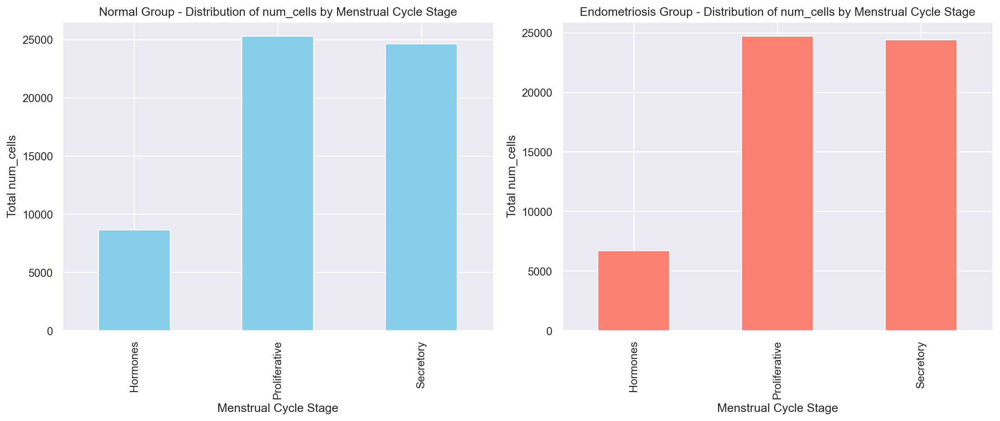

Total 'num_cells' for True values in 'normal' group: 58618
Total 'num_cells' for True values in 'endometriosis' group: 55841
Total number of True values in 'normal' group: 7
Total number of True values in 'endometriosis' group: 6


In [17]:
# Assuming previous code runs and we have `meta_df_filtered` with the 'keep' column set to True/False

# Step 1: Create a new DataFrame for the rows where 'keep' is True
true_meta_df = meta_df_filtered[meta_df_filtered['keep'] == True]

# Step 2: Group by 'Factor Value[menstrual_cycle_stage]' and sum 'num_cells' for each group
normal_true_df = true_meta_df[true_meta_df['Characteristics[disease]'] == 'normal']
endometriosis_true_df = true_meta_df[true_meta_df['Characteristics[disease]'] == 'endometriosis']

# Step 3: Calculate the total number of cells for each stage and disease group
normal_stage_cells = normal_true_df.groupby('Factor Value[menstrual_cycle_stage]')['num_cells'].sum()
endometriosis_stage_cells = endometriosis_true_df.groupby('Factor Value[menstrual_cycle_stage]')['num_cells'].sum()

# Step 4: Plot barplots to visualize the distribution of 'num_cells' for each stage
plt.figure(figsize=(14, 6))

# Plot normal group
plt.subplot(1, 2, 1)
normal_stage_cells.plot(kind='bar', color='skyblue', title='Normal Group - Distribution of num_cells by Menstrual Cycle Stage')
plt.ylabel('Total num_cells')
plt.xlabel('Menstrual Cycle Stage')

# Plot endometriosis group
plt.subplot(1, 2, 2)
endometriosis_stage_cells.plot(kind='bar', color='salmon', title='Endometriosis Group - Distribution of num_cells by Menstrual Cycle Stage')
plt.ylabel('Total num_cells')
plt.xlabel('Menstrual Cycle Stage')

plt.tight_layout()
plt.show()

# Step 5: Calculate and print the total number of cells for each disease group
normal_true_total_cells = normal_true_df['num_cells'].sum()
endometriosis_true_total_cells = endometriosis_true_df['num_cells'].sum()

print(f"Total 'num_cells' for True values in 'normal' group: {normal_true_total_cells}")
print(f"Total 'num_cells' for True values in 'endometriosis' group: {endometriosis_true_total_cells}")

# Step 6: Check the total number of True values in each group
normal_true_count = normal_true_df.shape[0]
endometriosis_true_count = endometriosis_true_df.shape[0]

print(f"Total number of True values in 'normal' group: {normal_true_count}")
print(f"Total number of True values in 'endometriosis' group: {endometriosis_true_count}")

In [18]:
true_meta_df['Source Name'].duplicated().unique()

array([False])

In [19]:
# Step 1: Filter the combined_adata by the 'dataset' present in true_meta_df
combined_adata = combined_adata[combined_adata.obs['dataset'].isin(true_meta_df['Source Name'])]

# Step 2: Add 'Menstrual Cycle Stage' and 'disease state' (e.g., 'Characteristics[disease]')
# Assuming 'true_meta_df' contains the necessary columns ('Factor Value[menstrual_cycle_stage]', 'Characteristics[disease]')
combined_adata.obs['Menstrual Cycle Stage'] = combined_adata.obs['dataset'].map(true_meta_df.set_index('Source Name')['Factor Value[menstrual_cycle_stage]'])
combined_adata.obs['Disease State'] = combined_adata.obs['dataset'].map(true_meta_df.set_index('Source Name')['Characteristics[disease]'])

# Optionally, check if the columns were added correctly
print(combined_adata.obs[['Menstrual Cycle Stage', 'Disease State']].head())


C:\Users\Olaf\AppData\Local\Temp\ipykernel_21052\1184036329.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  combined_adata.obs['Menstrual Cycle Stage'] = combined_adata.obs['dataset'].map(true_meta_df.set_index('Source Name')['Factor Value[menstrual_cycle_stage]'])


                   Menstrual Cycle Stage  Disease State
AGGTAGGTCCTCACTG-1         Proliferative  endometriosis
AGCGTATCAGAAGTTA-1         Proliferative  endometriosis
CCCATTGCACATACGT-1         Proliferative  endometriosis
ATTCGTTTCCCATGGG-1         Proliferative  endometriosis
GCACATATCTGGGCCA-1         Proliferative  endometriosis


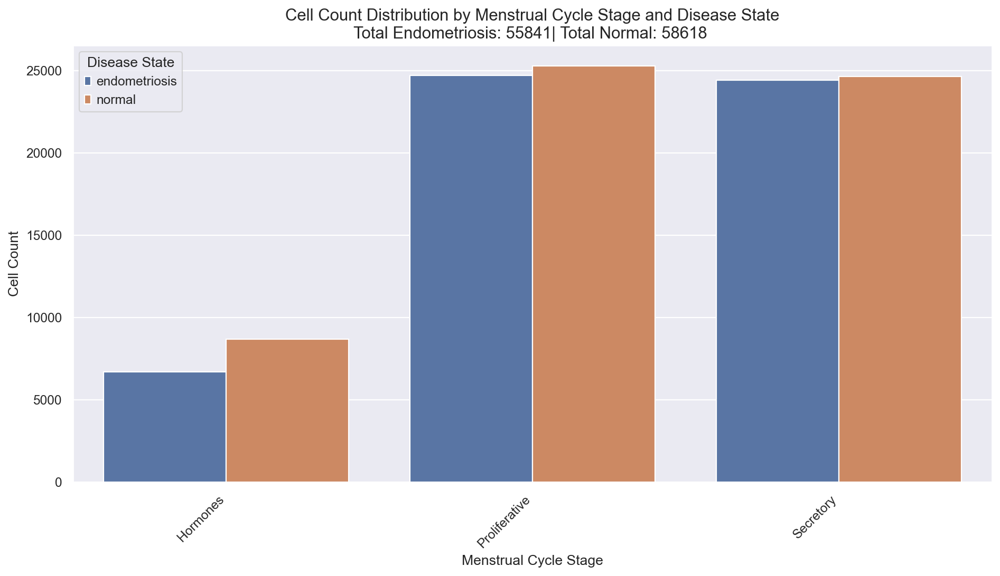

In [20]:
cell_count_by_stage_disease = combined_adata.obs.groupby(['Menstrual Cycle Stage', 'Disease State']).size().reset_index(name='Cell Count')

total_normal_cells = combined_adata.obs[combined_adata.obs['Disease State'] == 'normal'].shape[0]
total_endometriosis_cells = combined_adata.obs[combined_adata.obs['Disease State'] == 'endometriosis'].shape[0]

plt.figure(figsize=(12, 7))
sns.barplot(data=cell_count_by_stage_disease, x='Menstrual Cycle Stage', y='Cell Count', hue='Disease State')

plt.title(f'Cell Count Distribution by Menstrual Cycle Stage and Disease State\n'
          f'Total Endometriosis: {total_endometriosis_cells}| Total Normal: {total_normal_cells} ', fontsize=14)

plt.xlabel('Menstrual Cycle Stage', fontsize=12)
plt.ylabel('Cell Count', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend(title='Disease State')

plt.tight_layout()
plt.show()


In [21]:
#from scipy import sparse

#sparse_X = sparse.csr_matrix(combined_adata.X)
#combined_adata.X = sparse_X

In [22]:


combined_adata.var.head()



""
MIR1302-2HG
FAM138A
OR4F5
AL627309.1
AL627309.3


In [23]:
print(combined_adata.var_names)
combined_adata.X

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.5', 'AL627309.4', 'AP006222.2', 'AL732372.1',
       ...
       'AC133551.1', 'AC136612.1', 'AC136616.1', 'AC136616.3', 'AC136616.2',
       'AC141272.1', 'AC023491.2', 'AC007325.1', 'AC007325.4', 'AC007325.2'],
      dtype='object', length=36601)


<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 387215659 stored elements and shape (114459, 36601)>

In [24]:
combined_adata.obs
#output_file = "output/integrated_data.h5ad"
#combined_adata.write(output_file) # might just be failing because it already exists

,dataset,Menstrual Cycle Stage,Disease State
AGGTAGGTCCTCACTG-1,UA_Endo10281925_FX1101,Proliferative,endometriosis
AGCGTATCAGAAGTTA-1,UA_Endo10281925_FX1101,Proliferative,endometriosis
CCCATTGCACATACGT-1,UA_Endo10281925_FX1101,Proliferative,endometriosis
ATTCGTTTCCCATGGG-1,UA_Endo10281925_FX1101,Proliferative,endometriosis
GCACATATCTGGGCCA-1,UA_Endo10281925_FX1101,Proliferative,endometriosis
...,...,...,...
TTTGTTGCACGGGCTT-1,UA_Endo9426399_FX1146,Proliferative,normal
TTTGTTGCAGGTTCAT-1,UA_Endo9426399_FX1146,Proliferative,normal
TTTGTTGCATACCGTA-1,UA_Endo9426399_FX1146,Proliferative,normal
TTTGTTGGTATGCTAC-1,UA_Endo9426399_FX1146,Proliferative,normal


## Quality Control

In [25]:
combined_adata.var['MT'] = combined_adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(combined_adata, qc_vars=['MT'], percent_top=None, log1p=False, inplace=True)


combined_adata.obs.head()



,dataset,Menstrual Cycle Stage,Disease State,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT
AGGTAGGTCCTCACTG-1,UA_Endo10281925_FX1101,Proliferative,endometriosis,2053,3284.0,2.0,0.060901
AGCGTATCAGAAGTTA-1,UA_Endo10281925_FX1101,Proliferative,endometriosis,2200,3445.0,6.0,0.174165
CCCATTGCACATACGT-1,UA_Endo10281925_FX1101,Proliferative,endometriosis,3130,6340.0,2.0,0.031546
ATTCGTTTCCCATGGG-1,UA_Endo10281925_FX1101,Proliferative,endometriosis,2419,4101.0,11.0,0.268227
GCACATATCTGGGCCA-1,UA_Endo10281925_FX1101,Proliferative,endometriosis,3015,5605.0,1.0,0.017841


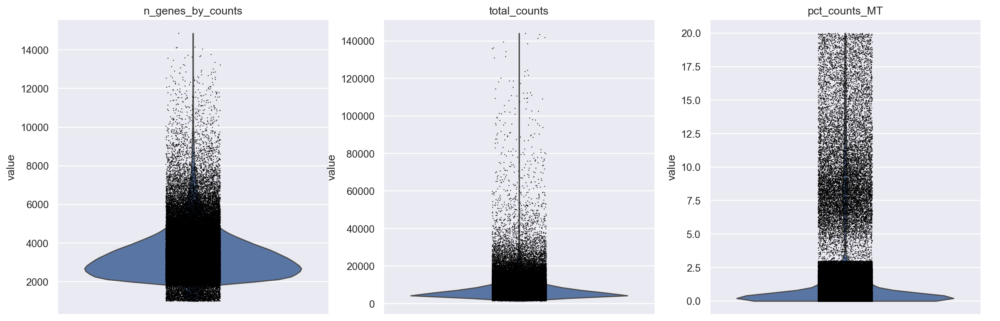

In [26]:
sc.pl.violin(
    combined_adata, 
    [
     'n_genes_by_counts', 
     'total_counts', 
     'pct_counts_MT'
     ],
    multi_panel=True
)

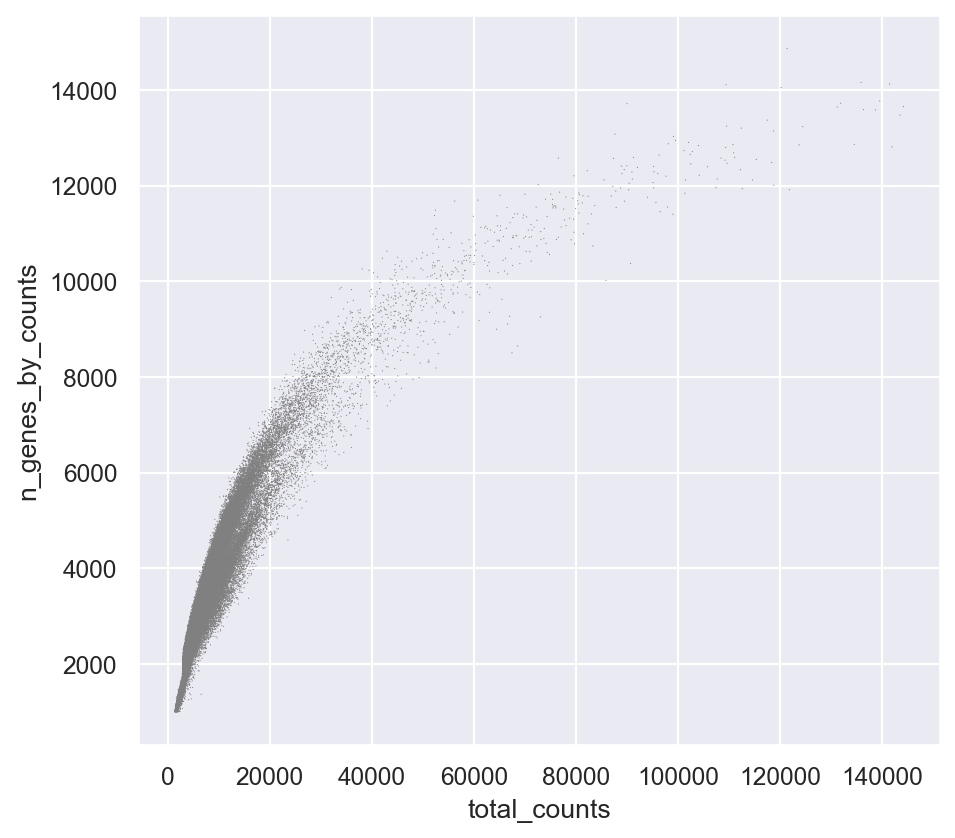

In [27]:
sc.pl.scatter(combined_adata, "total_counts", "n_genes_by_counts")

In [47]:
cell_cycle_genes = [x.strip() for x in open(input_path/'regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in combined_adata.var_names]


In [51]:
sc.tl.score_genes_cell_cycle(combined_adata, s_genes = s_genes, g2m_genes = g2m_genes)

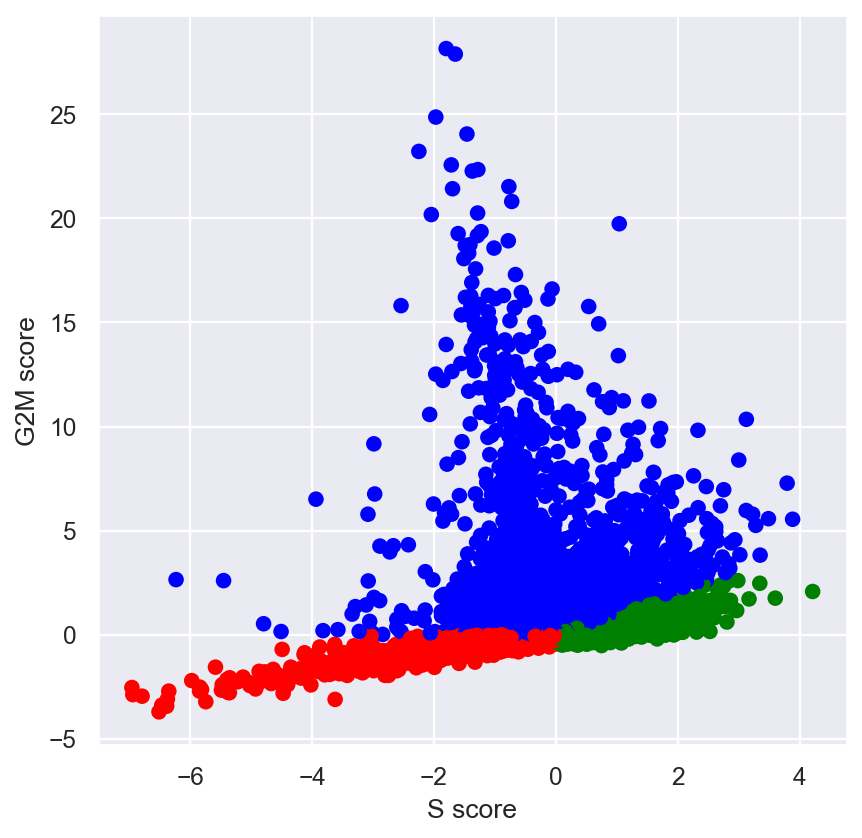

In [53]:
n2c = {"G1": "red", "S":"green", "G2M":"blue"}
plt.scatter(combined_adata.obs['S_score'], combined_adata.obs['G2M_score'], c=[n2c[k] for k in combined_adata.obs['phase']])
plt.xlabel('S score'); plt.ylabel('G2M score')
plt.show()

In [58]:
del(batch_counts, batch_table, cell_count_by_stage_disease, cell_cycle_genes, df, endometriosis_df, endometriosis_true_df, meta_df_filtered, meta_diseased_secretory, normal_df, normal_true_df, s_genes, stage_df, true_meta_df)

In [8]:
output_file = scrna_output/"combined_subset_not_normalized.h5ad"
#combined_adata.write(output_file)
combined_adata = sc.read(output_file)


In [9]:

#rm(total_normal_cells, total_endometriosis_cells, total_cells, total, stage_df, stage_cells, stage, source_name_list, proportion, normal_true_df, normal_true_count, normal_stage_cells, normal_stage_distribution, normal_df, normal_cells_for_true, normal_cells, n2c, meta_diseased_secretory, meta_df_filtered, final_true_sum, free, endometriosis_true_df, endometriosis_true_count, endometriosis_stage_distribution, endometriosis_stage_cells, endometriosis_df, disease_counts, endometriosis_cells, endometriosis_cells_for_true, disease_counts, df )
sc.pp.regress_out(combined_adata, ['pct_counts_MT']) #'S_score', 'G2M_score', 


MemoryError: Unable to allocate 864. MiB for an array with shape (989, 114459) and data type float64

In [9]:
sc.pp.scale(combined_adata)

In [10]:
sc.pp.filter_cells(combined_adata, min_genes=100)
sc.pp.filter_genes(combined_adata, min_cells=3)

MemoryError: Unable to allocate 15.6 GiB for an array with shape (114459, 36601) and data type float32

In [ ]:
#skipping, I don't think doublets make sense to detect with dataset that has already been processed and integrated.
#sc.pp.scrublet(combined_adata, batch_key="sample")

In [ ]:
#os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
#combined_adata = sc.read("output/integrated_data.h5ad")

### Normalization

In [ ]:
sc.pp.normalize_total(combined_adata, target_sum=1e4) 
sc.pp.log1p(combined_adata) 
combined_adata.layers["lognormalized"] = combined_adata.X.copy()


In [ ]:
fig, axes = plt.subplots(1, 2, figsize = (10, 5))
p1 = sns.histplot(combined_adata.obs["n_counts"], bin = 100, kde=False, ax = axes[0])
axes[0].set_title("Total counts")
p1 = sns.histplot(combined_adata.obs["lognormalized"], bin = 100, kde=False, ax = axes[0])
axes[0].set_title("log normalized")

In [ ]:
combined_adata.X.expm1().sum(axis = 1)

matrix([[10000.   ],
        [10000.   ],
        [10000.   ],
        ...,
        [ 9999.999],
        [10000.001],
        [10000.   ]], dtype=float32)

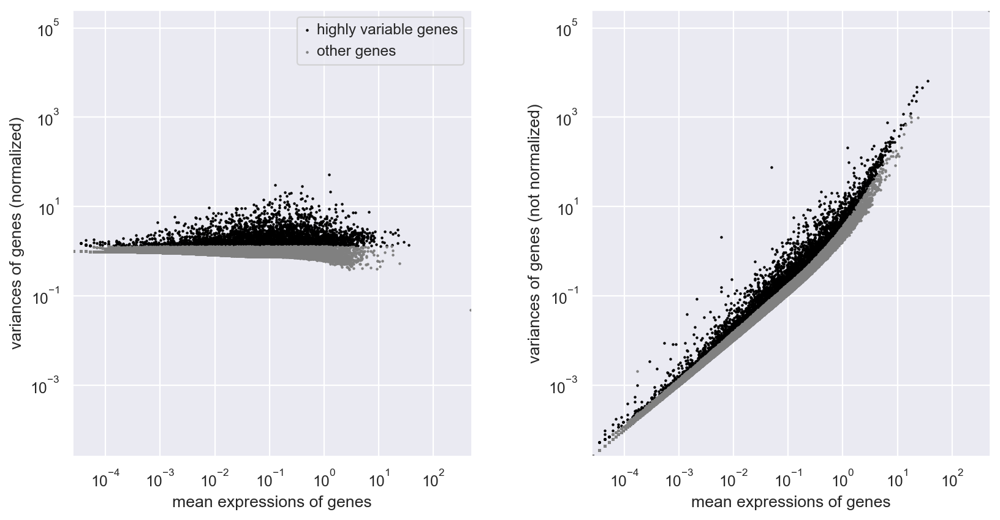

In [ ]:
sc.pp.highly_variable_genes(
    combined_adata,
    n_top_genes=4000,
    # subset=True, # to automatically subset to the 4000 genes
    layer="counts",
    flavor="seurat_v3"
)
sc.pl.highly_variable_genes(combined_adata, log=True)

In [ ]:
combined_adata = combined_adata[:, combined_adata.var.highly_variable].copy()
combined_adata.raw.to_adata()

AnnData object with n_obs × n_vars = 114459 × 33682
    obs: 'dataset', 'Menstrual Cycle Stage', 'Disease State', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'n_genes'
    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'log1p', 'hvg'

In [ ]:
combined_adata.var.columns

# The .var attribute stores metadata related to variables (typically genes). 
#view with specific with
## adata.var['gene_type'].head()


Index(['MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts',
       'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank',
       'means', 'variances', 'variances_norm'],
      dtype='object')

In [ ]:
combined_adata.obs.columns
#The .obs attribute stores metadata related to the observations (cells). To see the available metadata columns:
#view with 
## adata.obs['cell_type'].head()

Index(['dataset', 'Menstrual Cycle Stage', 'Disease State',
       'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT',
       'n_genes'],
      dtype='object')

In [ ]:
combined_adata.uns.keys()
#The .uns attribute contains unstructured annotations that may include
#  clustering results, embeddings, or other metadata that doesn’t fit neatly into .obs or .var. 

odict_keys(['log1p', 'hvg'])

In [ ]:
print(combined_adata.layers.keys())

KeysView(Layers with keys: counts)


### Standard Workflow

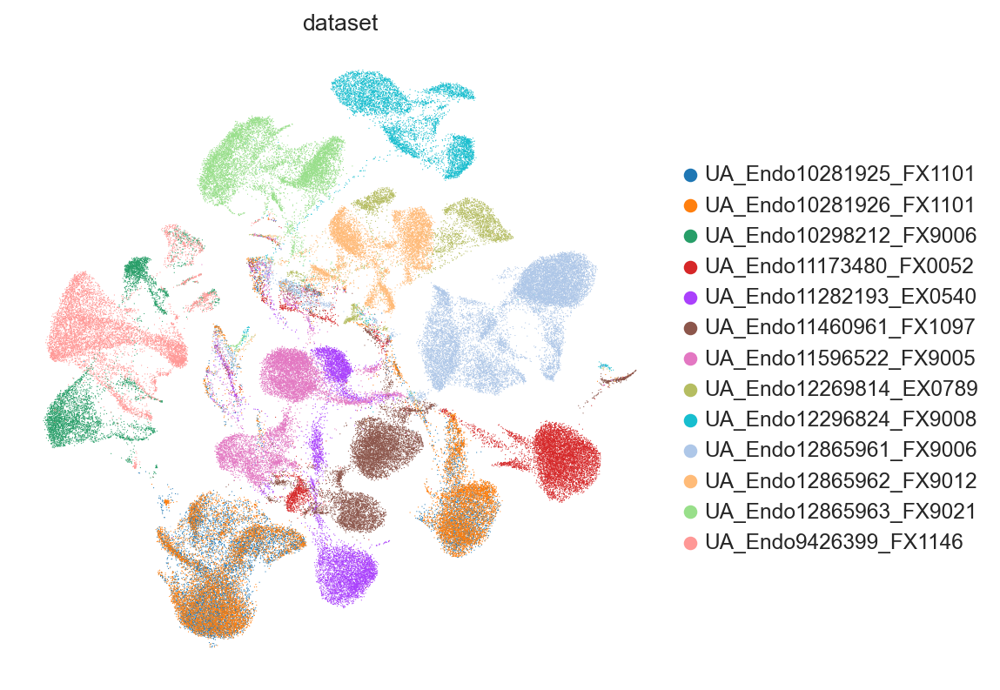

In [ ]:
sc.pp.scale(combined_adata) # z normalize the columns (genes)
sc.tl.pca(combined_adata)


combined_adata.obsm["X_pca"]
sc.pp.neighbors(combined_adata) # compute nearest neighbors
sc.tl.umap(combined_adata)
sc.pl.umap(combined_adata, color="dataset")

 #combined_adata.X.expm1().sum(axis = 1)
doesn't work anymore because numpy.ndarray objects (used after scaling or PCA) do not have the .expm1() method. The .expm1() method is specifically for sparse matrices or objects that are compatible with this operation, and after scaling, you're working with a standard dense numpy.ndarray.

can try combined_adata.raw.X.expm1().sum(axis=1)    or    np.expm1(combined_adata.X).sum(axis=1) instead

IF THE CLUSTERS ARE BY BATCH:: ADD THIS CODE:

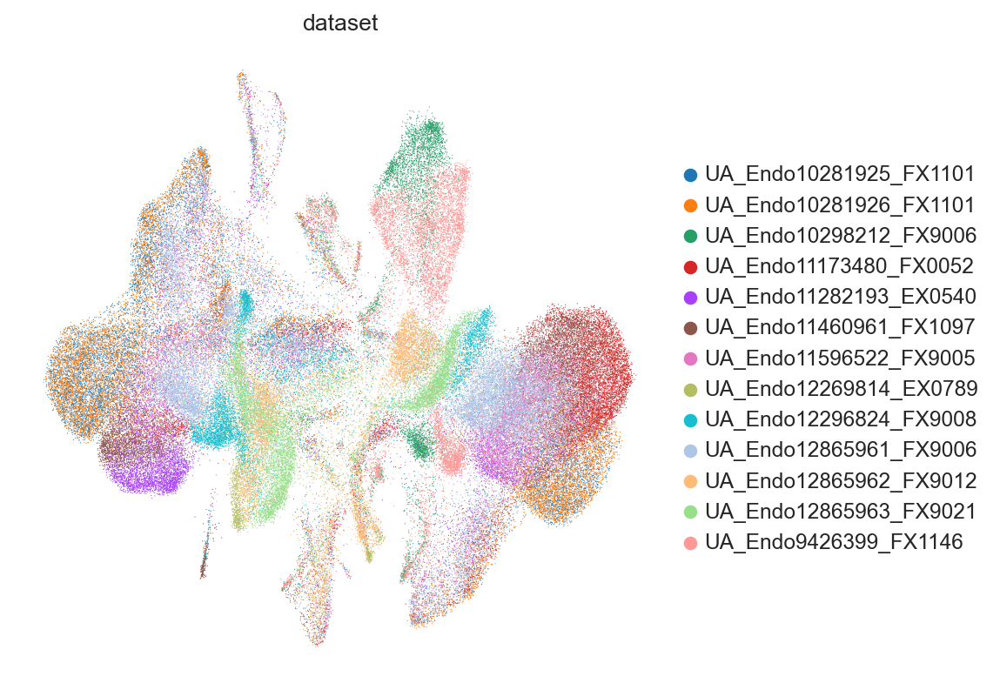

In [ ]:

sce.pp.bbknn(combined_adata, batch_key="dataset")
sc.tl.umap(combined_adata)
sc.pl.umap(combined_adata, color=["dataset"], ncols=1)
#don't know what this 'computation' warning is. No 'computation' parameter in bbknn or umap


In [ ]:
#combined_adata.write(scrna_output/"combined_with_umap_no_scvi.h5ad")
combined_adata = sc.read(scrna_output/"combined_with_umap_no_scvi.h5ad")
combined_adata.obs.head()



,dataset,Menstrual Cycle Stage,Disease State,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT,n_genes
AGGTAGGTCCTCACTG-1,UA_Endo10281925_FX1101,Proliferative,endometriosis,2053,3284.0,2.0,0.060901,2053
AGCGTATCAGAAGTTA-1,UA_Endo10281925_FX1101,Proliferative,endometriosis,2200,3445.0,6.0,0.174165,2200
CCCATTGCACATACGT-1,UA_Endo10281925_FX1101,Proliferative,endometriosis,3130,6340.0,2.0,0.031546,3130
ATTCGTTTCCCATGGG-1,UA_Endo10281925_FX1101,Proliferative,endometriosis,2419,4101.0,11.0,0.268227,2419
GCACATATCTGGGCCA-1,UA_Endo10281925_FX1101,Proliferative,endometriosis,3015,5605.0,1.0,0.017841,3015


IF IT STILL DOESN'T WORK THEN REDO THE LOAD IN AND USE SCIVI
https://ccbskillssem.github.io/assets/scvi_notebook.html

https://www.youtube.com/watch?v=EKTg9NV5hEA

In [ ]:

print(scvi.__version__)
# Set up the AnnData object (combined_adata)
scvi.model.SCVI.setup_anndata(combined_adata, layer="counts", batch_key='dataset')

# Initialize the SCVI model
model = scvi.model.SCVI(combined_adata) #, n_layers=2, n_latent=30, gene_likelihood="nb"

# Set the number of workers for data loading
scvi.settings.dl_num_workers = 0 #default is 0, gives warnings to raise but then gives iter(combined_loader) errors
# Train the model, specifying the accelerator (GPU or CPU)


1.2.0


In [ ]:
model

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal.
Training status: Not Trained
Model's adata is minified?: False

In [ ]:
print(str(combined_adata))
print(combined_adata.layers)

AnnData object with n_obs × n_vars = 114459 × 4000
    obs: 'dataset', 'Menstrual Cycle Stage', 'Disease State', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'n_genes', '_scvi_batch', '_scvi_labels'
    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'dataset_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'
Layers with keys: counts


In [ ]:
model.train() 
model.save(other_output, overwrite=True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
d:\Coding\comp_bio\endometrial_analysis\scripts\integration\.venv\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Training:   0%|          | 0/70 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=70` reached.


In [ ]:

model = scvi.model.SCVI.load(other_output, combined_adata)

INFO     File d:\Coding\comp_bio\endometrial_analysis\output\scvi\heca_vsdisease\model.pt already downloaded       


d:\Coding\comp_bio\endometrial_analysis\scripts\integration\.venv\Lib\site-packages\scvi\model\base\_save_load.py:76: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = t

In [ ]:
SCVI_LATENT_KEY = "X_scVI"

In [ ]:

combined_adata.obsm[SCVI_LATENT_KEY] = model.get_latent_representation()

In [ ]:
str(combined_adata)

"AnnData object with n_obs × n_vars = 114459 × 4000\n    obs: 'dataset', 'Menstrual Cycle Stage', 'Disease State', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'n_genes', '_scvi_batch', '_scvi_labels'\n    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'\n    uns: 'dataset_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap', '_scvi_uuid', '_scvi_manager_uuid'\n    obsm: 'X_pca', 'X_umap', 'X_scVI'\n    varm: 'PCs'\n    layers: 'counts'\n    obsp: 'connectivities', 'distances'"

In [ ]:
combined_adata.layers["scvi_expr"] = model.get_normalized_expression(combined_adata, n_samples=5, return_mean=True)

### Correlation
Captures changes in gene expression profiles and ignores overall gene expression levels
- More sensitive to co-expression patterns, ideal for capturing gene expression relationships in scRNA-seq.
- Better at identifying biological similarities across cells with different expression magnitudes.
- May not distinguish between large-scale differences in expression levels, which could be important in certain biological contexts.

In [ ]:
sc.pp.neighbors(combined_adata, use_rep=SCVI_LATENT_KEY , metric="correlation", key_added="neighbors_corr")
sc.tl.leiden(combined_adata, key_added="leiden_scvi_corr", resolution=1.2)

C:\Users\Olaf\AppData\Local\Temp\ipykernel_20736\1476352654.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(combined_adata, key_added="leiden_scvi_corr", resolution=1.2)


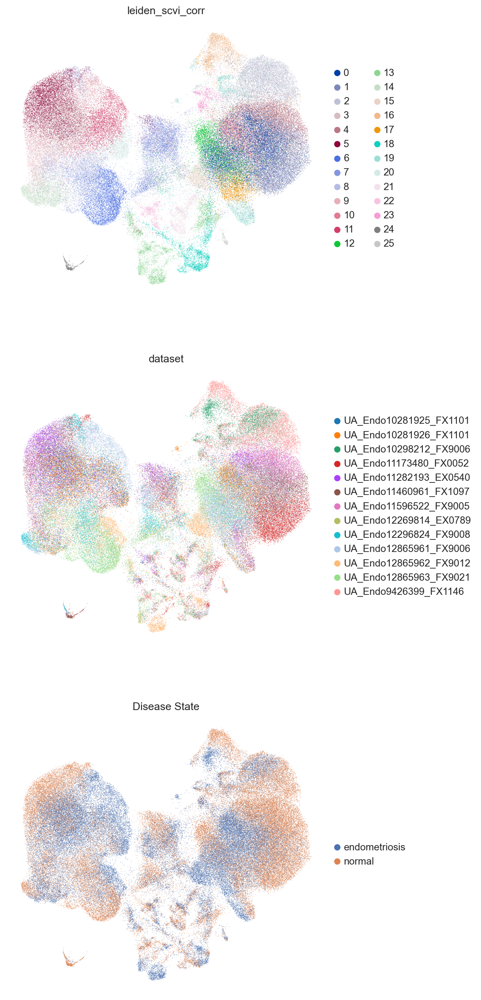

In [ ]:
sc.tl.umap(combined_adata, min_dist=0.4, neighbors_key="neighbors_corr")
sc.pl.umap(combined_adata, 
    color=["leiden_scvi_corr", "dataset", "Disease State", "Phase"],
    frameon=False,
    ncols=2)

### Euclidean distance

easures the straight-line distance in the feature space, making it useful for identifying clusters based on absolute gene expression levels, but it may not capture subtler, nonlinear relationships or correlation.
- Simple and intuitive, works well when absolute gene expression differences are significant.
- Captures overall distance between cells, which is helpful for visualizing general patterns.
- Can be sensitive to outliers and large expression scale differences, potentially distorting clustering in scRNA-seq.

In [ ]:
sc.pp.neighbors(combined_adata, use_rep=SCVI_LATENT_KEY , metric="euclidean", key_added="neighbors_euc")
sc.tl.leiden(combined_adata, key_added="leiden_scvi_euc", resolution=1.2, neighbors_key="neighbors_euc")




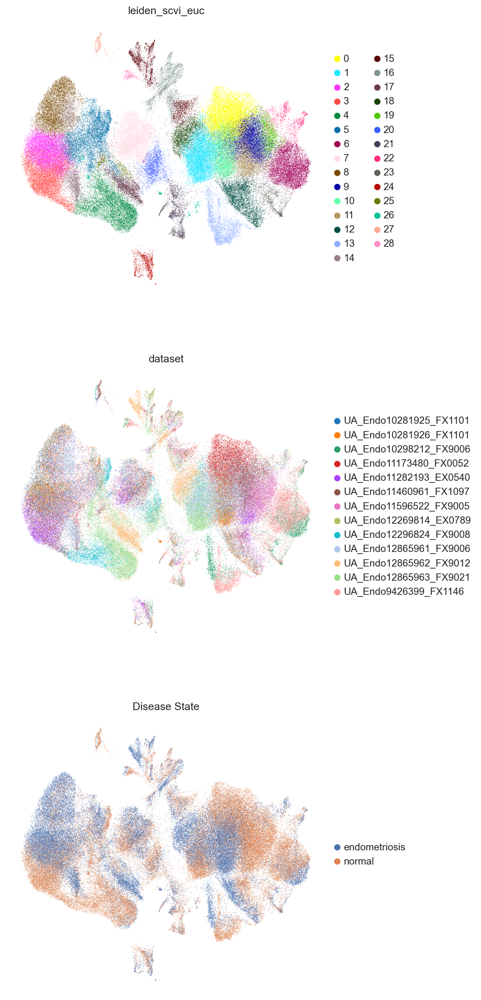

In [ ]:
sc.tl.umap(combined_adata, min_dist=0.4, neighbors_key= "neighbors_euc")
sc.pl.umap(combined_adata, 
    color=["leiden_scvi_euc", "dataset", "Disease State", "Phase"],
    frameon=False,
    ncols=2)

### Manifold embeddings (non-linear)


In [ ]:
SCVI_MDE_KEY = "X_scVI_MDE"
combined_adata.obsm[SCVI_MDE_KEY] = scvi.model.utils.mde(combined_adata.obsm[SCVI_LATENT_KEY]) #last run was with , accelerator="cpu" but I removed this so that it can use gpu, return if breaks

INFO     Using cuda:0 for `pymde.preserve_neighbors`.                                                              


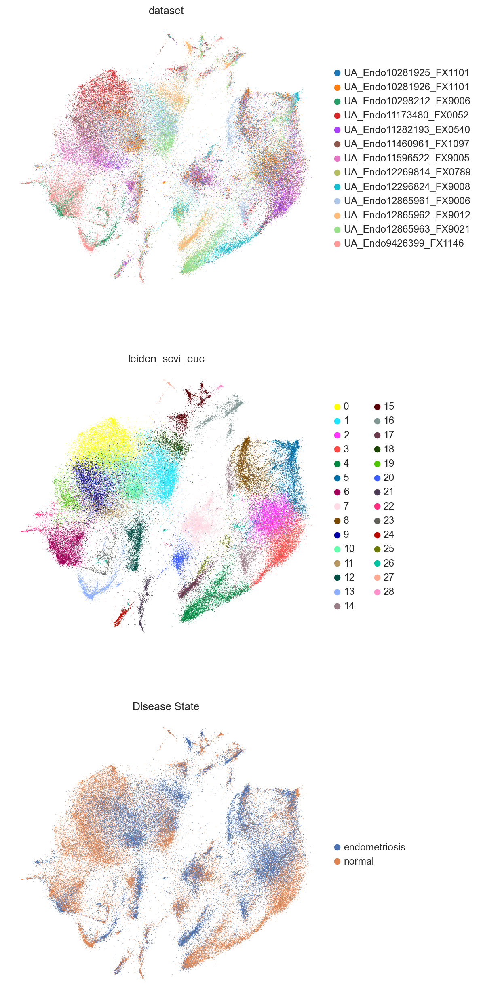

In [ ]:
sc.pl.embedding(
    combined_adata,
    basis=SCVI_MDE_KEY,
    color=["dataset", "leiden_scvi_euc", "Disease State"],
    frameon=False,
    ncols=1,
)

In [ ]:
output_file = scrna_output/"scvi_integrated.h5ad"
combined_adata.write(output_file)
#combined_adata = sc.read(output_file)
